In [44]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
model_dir = '/kuacc/users/mali18/dicomogan/logs/_510_face_splice2022-11-01T02-55-15'
img_root = '/scratch/users/abond19/datasets/RAVDESS/Aligned'
inverted_img_root = '/scratch/users/abond19/datasets/inverted_face_dataset'
inversion_root = '/kuacc/users/abond19/datasets/w+_face_dataset'

In [3]:
model_dir = '/kuacc/users/mali18/dicomogan/logs/_resume__422_fashion_w_sampling_diff_style2022-11-06T16-06-052022-11-08T00-54-58'
# model_dir = '/kuacc/users/abond19/VideoEditing/dicomogan/logs/_updated_fashion_with_no_consistency_loss2022-11-01T01-15-43'
img_root = '/kuacc/users/abond19/datasets/aligned_fashion_dataset'
inverted_img_root =  '/kuacc/users/abond19/datasets/inverted_fashion_dataset'
inversion_root =  '/kuacc/users/abond19/datasets/w+_fashion_dataset/fashion/PTI/'

In [4]:
device = 'cuda'

In [5]:
n_start = 5
step = 2
n_frames = 10
save_ckpt = True

In [113]:
video = '8c113106'

In [7]:
video = 'Actor_20_106'

In [124]:
from experiments_utils import *
model = load_model_from_dir(model_dir).to(device)

Using cache found in /kuacc/users/mali18/.cache/torch/hub/facebookresearch_dino_main


Restored from /kuacc/users/mali18/dicomogan/logs/_resume__422_fashion_w_sampling_diff_style2022-11-06T16-06-052022-11-08T00-54-58/checkpoints/epoch=000339.ckpt


In [8]:
# load images
import os
import torch 
from PIL import Image
import torchvision.transforms as transforms
IMG_EXTENSIONS = ['.png', '.PNG']
TXT_EXTENSIONS = ['.txt']
from IPython.display import Image as IPImage


crop = None
size = None
trans_list = []
if crop is not None:
    trans_list.append(transforms.CenterCrop(tuple(crop)))
if size is not None:
    trans_list.append(transforms.Resize(tuple(size)))
trans_list.append(transforms.ToTensor())
img_transform=transforms.Compose(trans_list)

def is_image_file(filename):
    return any(filename.endswith(extension) for extension in IMG_EXTENSIONS)

def is_text_file(filename):
    return any(filename.endswith(extension) for extension in TXT_EXTENSIONS)

def get_image(img_path):
    img = Image.open(img_path).convert('RGB')
    return img

def get_inversion(inversion_path):
    w_vector = torch.load(inversion_path, map_location='cpu')
    if len(w_vector.shape) == 2:
        w_vector = w_vector.unsqueeze(0)
    assert (w_vector.shape == (1, 18, 512)), "Inverted vector has incorrect shape"
    return w_vector

def load_video(vid_path):
    images, inversions, sampleT, inversion_imgs = [], [], [], [] 
    fname = vid_path
    
    lst_vid = sorted(os.listdir(os.path.join(img_root, fname)))
    lst_vid = sorted([vid for vid in lst_vid if vid.endswith('png')])
    def correct(f):
        if is_image_file(f):
            return int(f.split('.')[0])
        else:
            return f
    
    lst_vid = list(map(correct, lst_vid))[:-1]
#     print(lst_vid)
    inds = np.argsort(lst_vid)
#     print(inds)
    inds = inds[n_start:n_start+step*n_frames:step]
    for f in np.array(sorted(os.listdir(os.path.join(img_root, fname))))[inds]:
        if is_image_file(f):
#             print(f)
            imname = f[:-4]
            images.append(img_transform(get_image(os.path.join(img_root, fname, f))))
            inversion_imgs.append(img_transform(get_image(os.path.join(inverted_img_root, fname, f))))
            inversions.append(get_inversion(os.path.join(os.path.join(inversion_root, fname, imname + ".pt"))))
            sampleT.append(int(imname))
    
    with open(os.path.join(img_root, fname, 'updated_descriptions.txt')) as f:
        description = f.readlines()[0]

    return torch.stack(images).to(device), torch.cat(inversions, 0).to(device), torch.Tensor(sampleT).to(device), torch.stack(inversion_imgs).to(device), description

def display_gif(path):
    return IPImage(filename=path)

In [99]:
import imageio
import torchvision
def save_gif(video, range, save_path):
    frames_dir = os.path.join(f"{save_path[:-4]}")
    os.makedirs(frames_dir, exist_ok=True)
    # Assuming that the current shape is T * B x C x H x W
    with imageio.get_writer(save_path, mode='I') as writer:
       for i, b_frames in enumerate(video):
            # b_frames B x C x H x W
            b_frames = torch.clamp(b_frames, range[0], range[1])
            frame = torchvision.utils.make_grid(b_frames,
                            nrow=b_frames.shape[0],
                            normalize=True,
                            range=range).detach().cpu().numpy()
            frame = (np.transpose(frame, (1, 2, 0)) * 255).astype(np.uint8)
            writer.append_data(frame)
            
            Image.fromarray(frame).save(os.path.join(frames_dir, f"{i:06d}.png"))
#     wandb.log({name: wandb.Video(filename, fps=2, format="gif")})
#     os.remove(filename)


In [10]:
# 8c99223: A picture of a woman wearing a Women's Grey Regular fit Crop with a Round neckline and Short puff sleeves
# 1c113936: A picture of a woman wearing a Women's Pink Regular fit Pullover with a Round neckline and Long bell sleeves

# Reconstruct video

In [129]:
n_start = 20
step = 1
n_frames = 12

In [130]:
save_dir = os.path.join('applications_results', f"{model_dir.split('/')[-1]}", "PTI", video)
os.makedirs(save_dir, exist_ok=True)

In [131]:
a1, b1, c1, _, desc1 = load_video(video)

In [132]:
save_gif(a1, (0, 1), 'orginal.gif')

/kuacc/users/mali18/.conda/envs/styleode/lib/python3.8/site-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(


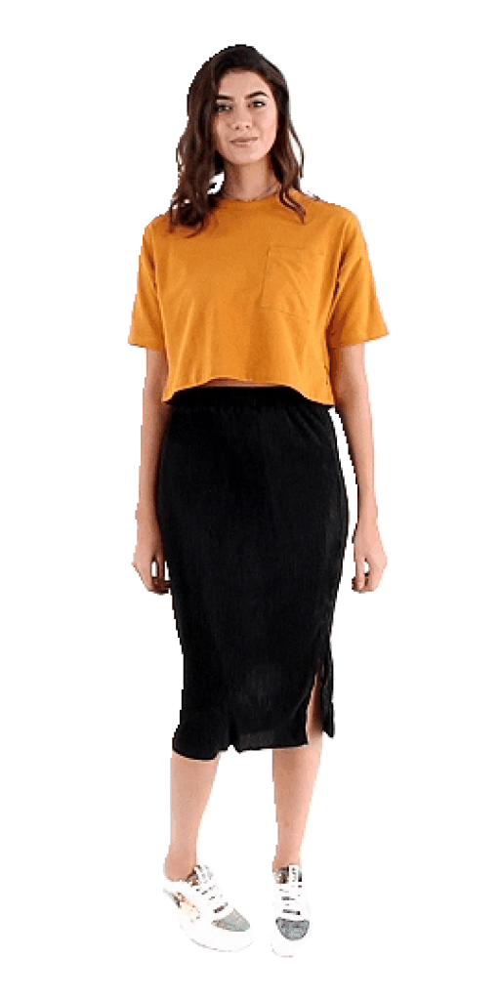

In [133]:
display_gif('orginal.gif')

In [134]:
c1

tensor([22., 23., 24., 25., 26., 27., 28., 29., 30., 31., 32., 33.],
       device='cuda:0')

In [135]:
ts = c1.clone() / model.video_length
ts = ts - ts[0]


In [136]:
b1.shape

torch.Size([12, 18, 512])

In [137]:
with torch.no_grad():
#     dyn = model.video_dynamic_rep(a1.unsqueeze(0), c1, mask=torch.ones(a1.shape[0], 1)) 
    txt_feat_1 = model.clip_encode_text(desc1)  # - model.clip_encode_text([src_desc])

    W_c_ind = len(b1) // 2
    W_c = b1[W_c_ind:W_c_ind+1]
    ref_frame = model.stylegan_G(W_c)
    ref_frame_enc =  model.clip_loss.encode_images(ref_frame)
    rec_vid_1 = model(a1.unsqueeze(0), 
                                  c1,
                                  W_c,
                                  torch.zeros_like(txt_feat_1),
                                 ref_frame_enc)[0]
    save_gif(rec_vid_1, (-1, 1), rec_1_path)

torch.Size([1, 18, 512])
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0

/kuacc/users/mali18/.conda/envs/styleode/lib/python3.8/site-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(


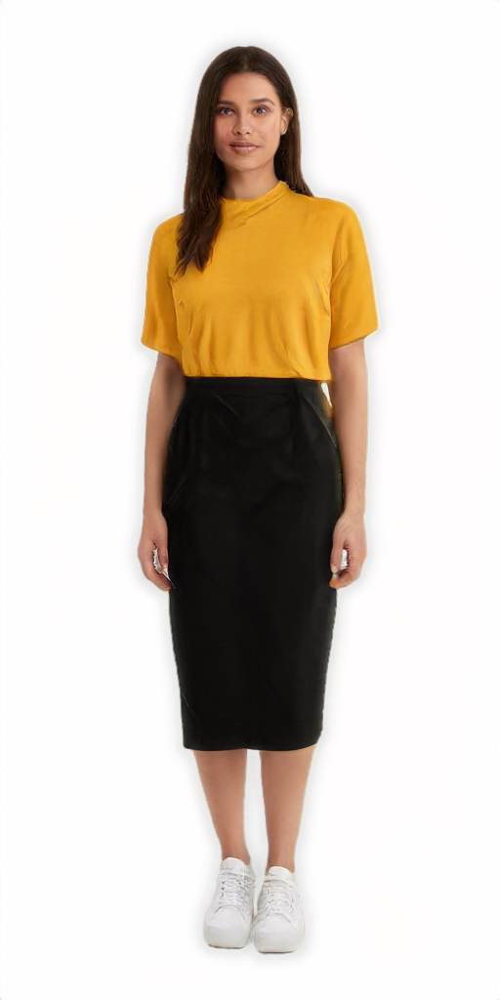

In [138]:
to_PIL(model.stylegan_G(W_c)[0])

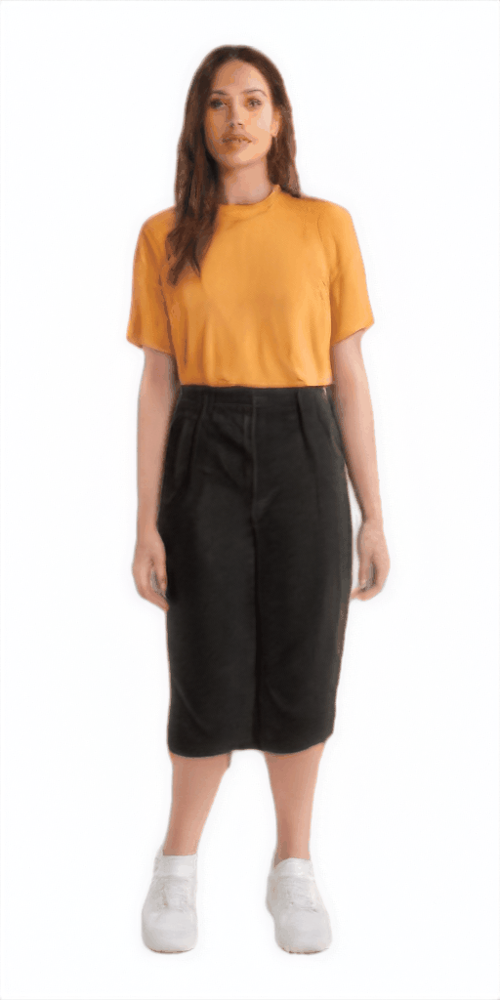

In [139]:
display_gif(rec_1_path)

# Fine Tune the generator

In [140]:
max_pti_steps = 200
pt_l2_lambda = 10.0
pt_lpips_lambda = 1.0 
lr = 3e-5
use_locality_regularization = False
locality_regularization_interval = 1

In [141]:
l2_criterion = torch.nn.MSELoss(reduction='mean')
def l2_loss(real_images, generated_images):
    loss = l2_criterion(real_images, generated_images)
    return loss


In [142]:
from lpips import LPIPS
lpips_loss = LPIPS(net='alex').to(device).eval()

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/kuacc/users/mali18/.conda/envs/styleode/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/kuacc/users/mali18/.conda/envs/styleode/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /kuacc/users/mali18/.conda/envs/styleode/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth


In [143]:
class SpaceRegularizer:
    def __init__(self, original_G, lpips_net):
        
        regularizer_alpha = 50
        self.latent_ball_num_of_samples = 1
        self.locality_regularization_interval = 1
        self.use_locality_regularization = True
        self.regularizer_l2_lambda = 0.1
        self.regularizer_lpips_lambda = 0.1
        
        
        self.original_G = original_G
        self.morphing_regularizer_alpha = regularizer_alpha
        self.lpips_loss = lpips_net
        self.regularizer_alpha = regularizer_alpha

    def get_morphed_w_code(self, new_w_code, fixed_w):
        interpolation_direction = new_w_code - fixed_w
        interpolation_direction_norm = torch.norm(interpolation_direction, p=2)
        direction_to_move = self.regularizer_alpha * interpolation_direction / interpolation_direction_norm
        result_w = fixed_w + direction_to_move
        self.morphing_regularizer_alpha * fixed_w + (1 - self.morphing_regularizer_alpha) * new_w_code

        return result_w

    def get_image_from_ws(self, w_codes, G):
        return torch.cat([G.synthesis(w_code, noise_mode='none', force_fp32=True) for w_code in w_codes])

    def ball_holder_loss_lazy(self, new_G, num_of_sampled_latents, w_batch, use_wandb=False):
        loss = 0.0

        z_samples = np.random.randn(num_of_sampled_latents, self.original_G.G.z_dim)
        w_samples = self.original_G.G.mapping(torch.from_numpy(z_samples).to(device), None,
                                            truncation_psi=0.5)
        territory_indicator_ws = [self.get_morphed_w_code(w_code.unsqueeze(0), w_batch) for w_code in w_samples]

        for w_code in territory_indicator_ws:
            new_img = new_G(w_code)
            with torch.no_grad():
                old_img = self.original_G(w_code)

            if self.regularizer_l2_lambda > 0:
                l2_loss_val = l2_loss(old_img, new_img)
                loss += l2_loss_val * self.regularizer_l2_lambda

            if self.regularizer_lpips_lambda > 0:
                loss_lpips = self.lpips_loss(old_img, new_img)
                loss_lpips = torch.mean(torch.squeeze(loss_lpips))
                loss += loss_lpips * self.regularizer_lpips_lambda

        return loss / len(territory_indicator_ws)

    def space_regularizer_loss(self, new_G, w_batch):
        ret_val = self.ball_holder_loss_lazy(new_G, self.latent_ball_num_of_samples, w_batch)
        return ret_val
    


In [144]:
def calc_loss(generated_images, real_images, new_G, use_ball_holder, w_batch):
        loss = 0.0

        if pt_l2_lambda > 0:
            l2_loss_val = l2_loss(generated_images, real_images)
            loss += l2_loss_val * pt_l2_lambda
        if pt_lpips_lambda > 0:
            loss_lpips = lpips_loss(generated_images, real_images)
            loss_lpips = torch.squeeze(loss_lpips)
            loss += loss_lpips * pt_lpips_lambda

        if use_ball_holder and use_locality_regularization:
            ball_holder_loss_val = space_regularizer.space_regularizer_loss(new_G, w_batch)
            loss += ball_holder_loss_val

        return loss, l2_loss_val, loss_lpips

# Reset

In [145]:
try: 
    model.stylegan_G = copy.deepcopy(original_G)
except: 
    print("No ")

# Train

In [146]:
# model.stylegan_G.synthesis.train()
# model.stylegan_G.mapping.train()
import copy
model.stylegan_G.train()
model.stylegan_G.requires_grad_(True)
model.requires_grad(model.stylegan_G, True)
original_G = copy.deepcopy(model.stylegan_G)
use_ball_holder = True
w_pivots = []
images = []

In [147]:
space_regularizer = SpaceRegularizer(original_G, lpips_loss)
optimizer = torch.optim.Adam(model.stylegan_G.parameters(), betas=(0.9, 0.999),
                                     lr=lr)

In [148]:
# ATTENTION: Do one. normalize images
a1 = a1 * 2 - 1
a1.shape

torch.Size([12, 3, 1024, 512])

In [ ]:
from collections import defaultdict
from tqdm import tqdm
print('Fine tuning generator')
training_step = 0
pbar = tqdm(range(max_pti_steps))
for step in pbar:
    step_loss_dict = defaultdict(list)
    t = (step + 1) / max_pti_steps

    for image, w_pivot in zip(a1, b1):
        image = image.unsqueeze(0)
        w_pivot = w_pivot.unsqueeze(0)
        generated_images = model.stylegan_G(w_pivot)
        loss, l2_loss_val, loss_lpips = calc_loss(generated_images, image,
                                                       model.stylegan_G, use_ball_holder, w_pivot)
        
        print(l2_loss_val.item(), loss_lpips.item())
        step_loss_dict['loss'].append(loss.item())
        step_loss_dict['l2_loss'].append(l2_loss_val.item())
        step_loss_dict['loss_lpips'].append(loss_lpips.item())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        use_ball_holder = training_step % locality_regularization_interval == 0

        training_step += 1
        pbar.set_description(f"loss: {l2_loss_val.item():.2f}")

    log_dict = {}
    for key, losses in step_loss_dict.items():
        loss_mean = sum(losses) / len(losses)
        loss_max = max(losses)
        log_dict[f'losses_agg/{key}_mean'] = loss_mean
        log_dict[f'losses_agg/{key}_max'] = loss_max

print('Finished training')

Fine tuning generator


loss: 0.04:   0%|          | 0/200 [00:00<?, ?it/s]

0.04446300491690636 0.18440254032611847
0.04360604286193848 0.17864620685577393


loss: 0.04:   0%|          | 0/200 [00:00<?, ?it/s]

0.04091982915997505 0.17760519683361053


loss: 0.04:   0%|          | 0/200 [00:00<?, ?it/s]

0.03867124766111374 0.17515169084072113


loss: 0.04:   0%|          | 0/200 [00:00<?, ?it/s]

0.037281572818756104 0.1745571792125702


loss: 0.04:   0%|          | 0/200 [00:00<?, ?it/s]

0.036056794226169586 0.17079153656959534


loss: 0.03:   0%|          | 0/200 [00:00<?, ?it/s]

0.03486444056034088 0.16820672154426575


loss: 0.03:   0%|          | 0/200 [00:01<?, ?it/s]

0.034596070647239685 0.16450826823711395


loss: 0.04:   0%|          | 0/200 [00:01<?, ?it/s]

0.03508880361914635 0.16669553518295288


loss: 0.04:   0%|          | 0/200 [00:01<?, ?it/s]

0.03532852977514267 0.17015165090560913


loss: 0.04:   0%|          | 0/200 [00:01<?, ?it/s]

0.035307757556438446 0.16897213459014893


loss: 0.04:   0%|          | 1/200 [00:01<04:53,  1.48s/it]

0.036105405539274216 0.17221134901046753


loss: 0.04:   0%|          | 1/200 [00:01<04:53,  1.48s/it]

0.04061727225780487 0.1793178915977478


loss: 0.04:   0%|          | 1/200 [00:01<04:53,  1.48s/it]

0.03985702246427536 0.17389148473739624


loss: 0.04:   0%|          | 1/200 [00:01<04:53,  1.48s/it]

0.03747875615954399 0.1727985441684723
0.03571360930800438 0.17187830805778503


loss: 0.04:   0%|          | 1/200 [00:01<04:53,  1.48s/it]

0.0347319059073925 0.1706080436706543


loss: 0.03:   0%|          | 1/200 [00:02<04:53,  1.48s/it]

0.03358756750822067 0.16622187197208405


loss: 0.03:   0%|          | 1/200 [00:02<04:53,  1.48s/it]

0.03256585821509361 0.1646346151828766


loss: 0.03:   0%|          | 1/200 [00:02<04:53,  1.48s/it]

0.032271914184093475 0.16034597158432007


loss: 0.03:   0%|          | 1/200 [00:02<04:53,  1.48s/it]

0.03293905779719353 0.16304385662078857


loss: 0.03:   0%|          | 1/200 [00:02<04:53,  1.48s/it]

0.03316721320152283 0.16654673218727112


loss: 0.03:   0%|          | 1/200 [00:02<04:53,  1.48s/it]

0.03329257294535637 0.16463595628738403


loss: 0.03:   1%|          | 2/200 [00:02<04:47,  1.45s/it]

0.034157805144786835 0.16882821917533875


loss: 0.04:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.03815782070159912 0.1747293770313263


loss: 0.04:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.037352100014686584 0.17051443457603455


loss: 0.04:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.035161472856998444 0.1689770519733429


loss: 0.03:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.0335736945271492 0.1677267849445343


loss: 0.03:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.03282235562801361 0.1667320728302002


loss: 0.03:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.03160920739173889 0.16338898241519928


loss: 0.03:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.030708469450473785 0.16048704087734222


loss: 0.03:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.03024371527135372 0.15663158893585205


loss: 0.03:   1%|          | 2/200 [00:03<04:47,  1.45s/it]

0.031017128378152847 0.15941405296325684


loss: 0.03:   1%|          | 2/200 [00:04<04:47,  1.45s/it]

0.031297728419303894 0.16314779222011566


loss: 0.03:   1%|          | 2/200 [00:04<04:47,  1.45s/it]

0.031465575098991394 0.1610027402639389


loss: 0.03:   2%|▏         | 3/200 [00:04<04:38,  1.42s/it]

0.032459042966365814 0.16607201099395752


loss: 0.04:   2%|▏         | 3/200 [00:04<04:38,  1.42s/it]

0.035955291241407394 0.17184998095035553


loss: 0.04:   2%|▏         | 3/200 [00:04<04:38,  1.42s/it]

0.03514177352190018 0.16702648997306824


loss: 0.03:   2%|▏         | 3/200 [00:04<04:38,  1.42s/it]

0.03320169448852539 0.164816752076149


loss: 0.03:   2%|▏         | 3/200 [00:04<04:38,  1.42s/it]

0.031718164682388306 0.16444304585456848


loss: 0.03:   2%|▏         | 3/200 [00:04<04:38,  1.42s/it]

0.03117966279387474 0.16328874230384827


loss: 0.03:   2%|▏         | 3/200 [00:04<04:38,  1.42s/it]

0.02983732335269451 0.1602545529603958


loss: 0.03:   2%|▏         | 3/200 [00:05<04:38,  1.42s/it]

0.029119929298758507 0.15641994774341583


loss: 0.03:   2%|▏         | 3/200 [00:05<04:38,  1.42s/it]

0.028532560914754868 0.15282045304775238


loss: 0.03:   2%|▏         | 3/200 [00:05<04:38,  1.42s/it]

0.02937689982354641 0.15595708787441254


loss: 0.03:   2%|▏         | 3/200 [00:05<04:38,  1.42s/it]

0.029712317511439323 0.15954206883907318


loss: 0.03:   2%|▏         | 3/200 [00:05<04:38,  1.42s/it]

0.029861103743314743 0.15638943016529083


loss: 0.03:   2%|▏         | 4/200 [00:05<04:35,  1.41s/it]

0.030958350747823715 0.16235393285751343


loss: 0.03:   2%|▏         | 4/200 [00:05<04:35,  1.41s/it]

0.033922433853149414 0.16807566583156586


loss: 0.03:   2%|▏         | 4/200 [00:05<04:35,  1.41s/it]

0.03309999406337738 0.16309094429016113


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.03142562508583069 0.1607794463634491


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.030032498762011528 0.160972461104393


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.029644586145877838 0.15974074602127075


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.028228547424077988 0.15600070357322693


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.02767167054116726 0.15326303243637085


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.027039479464292526 0.14860354363918304


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.02792752906680107 0.1521044820547104


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.02831493318080902 0.15557867288589478


loss: 0.03:   2%|▏         | 4/200 [00:06<04:35,  1.41s/it]

0.028478402644395828 0.152650848031044


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.029677171260118484 0.15816283226013184


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.03206855058670044 0.1647140234708786


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.03128659725189209 0.15928682684898376


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.029776886105537415 0.1564578413963318


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.028520910069346428 0.15743422508239746


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.028235986828804016 0.1558140218257904


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.026795174926519394 0.152104452252388


loss: 0.03:   2%|▎         | 5/200 [00:07<04:33,  1.40s/it]

0.02635430358350277 0.1497262418270111


loss: 0.03:   2%|▎         | 5/200 [00:08<04:33,  1.40s/it]

0.025681793689727783 0.14502748847007751
0.026625435799360275 0.14842785894870758


loss: 0.03:   2%|▎         | 5/200 [00:08<04:33,  1.40s/it]

0.027007609605789185 0.15174314379692078


loss: 0.03:   2%|▎         | 5/200 [00:08<04:33,  1.40s/it]

0.027191584929823875 0.1488809585571289


loss: 0.03:   3%|▎         | 6/200 [00:08<04:33,  1.41s/it]

0.028466682881116867 0.15348348021507263


loss: 0.03:   3%|▎         | 6/200 [00:08<04:33,  1.41s/it]

0.03051356039941311 0.16098757088184357


loss: 0.03:   3%|▎         | 6/200 [00:08<04:33,  1.41s/it]

0.02981455624103546 0.1562117636203766


loss: 0.03:   3%|▎         | 6/200 [00:08<04:33,  1.41s/it]

0.02832178585231304 0.1526566445827484


loss: 0.03:   3%|▎         | 6/200 [00:08<04:33,  1.41s/it]

0.027199923992156982 0.15361319482326508


loss: 0.03:   3%|▎         | 6/200 [00:09<04:33,  1.41s/it]

0.02701040729880333 0.1514510214328766


loss: 0.03:   3%|▎         | 6/200 [00:09<04:33,  1.41s/it]

0.025561470538377762 0.14869925379753113


loss: 0.03:   3%|▎         | 6/200 [00:09<04:33,  1.41s/it]

0.025157377123832703 0.14654479920864105


loss: 0.02:   3%|▎         | 6/200 [00:09<04:33,  1.41s/it]

0.024441733956336975 0.14174342155456543


loss: 0.03:   3%|▎         | 6/200 [00:09<04:33,  1.41s/it]

0.025421500205993652 0.14491137862205505
0.025789637118577957 0.1479085236787796


loss: 0.03:   3%|▎         | 6/200 [00:09<04:33,  1.41s/it]

0.026009630411863327 0.14510801434516907


loss: 0.03:   4%|▎         | 7/200 [00:09<04:33,  1.42s/it]

0.027339790016412735 0.14987397193908691
0.029190046712756157 0.1573924422264099


loss: 0.03:   4%|▎         | 7/200 [00:10<04:33,  1.42s/it]

0.028535079210996628 0.1524629294872284


loss: 0.03:   4%|▎         | 7/200 [00:10<04:33,  1.42s/it]

0.02700832299888134 0.14907263219356537


loss: 0.03:   4%|▎         | 7/200 [00:10<04:33,  1.42s/it]

0.026028787717223167 0.150011345744133
0.02590717002749443 0.14780806005001068


loss: 0.03:   4%|▎         | 7/200 [00:10<04:33,  1.42s/it]

0.024443229660391808 0.14416718482971191


loss: 0.02:   4%|▎         | 7/200 [00:10<04:33,  1.42s/it]

0.024071145802736282 0.14389094710350037


loss: 0.02:   4%|▎         | 7/200 [00:10<04:33,  1.42s/it]

0.023358836770057678 0.1379006952047348


loss: 0.02:   4%|▎         | 7/200 [00:11<04:33,  1.42s/it]

0.02437429688870907 0.14100489020347595


loss: 0.02:   4%|▎         | 7/200 [00:11<04:33,  1.42s/it]

0.024764012545347214 0.14430759847164154


loss: 0.03:   4%|▎         | 7/200 [00:11<04:33,  1.42s/it]

0.025016561150550842 0.1421411782503128


loss: 0.03:   4%|▍         | 8/200 [00:11<04:33,  1.42s/it]

0.026416828855872154 0.14699356257915497


loss: 0.03:   4%|▍         | 8/200 [00:11<04:33,  1.42s/it]

0.027980536222457886 0.15391266345977783


loss: 0.03:   4%|▍         | 8/200 [00:11<04:33,  1.42s/it]

0.02736104279756546 0.14902889728546143


loss: 0.03:   4%|▍         | 8/200 [00:11<04:33,  1.42s/it]

0.025838559493422508 0.1463051289319992


loss: 0.02:   4%|▍         | 8/200 [00:11<04:33,  1.42s/it]

0.02498338744044304 0.146914541721344


loss: 0.02:   4%|▍         | 8/200 [00:11<04:33,  1.42s/it]

0.02489525079727173 0.14455348253250122


loss: 0.02:   4%|▍         | 8/200 [00:12<04:33,  1.42s/it]

0.023462068289518356 0.1407914161682129


loss: 0.02:   4%|▍         | 8/200 [00:12<04:33,  1.42s/it]

0.023144859820604324 0.1407047063112259


loss: 0.02:   4%|▍         | 8/200 [00:12<04:33,  1.42s/it]

0.022457217797636986 0.13502120971679688


loss: 0.02:   4%|▍         | 8/200 [00:12<04:33,  1.42s/it]

0.02346276119351387 0.1370798498392105


loss: 0.02:   4%|▍         | 8/200 [00:12<04:33,  1.42s/it]

0.023883156478405 0.1404331773519516


loss: 0.02:   4%|▍         | 8/200 [00:12<04:33,  1.42s/it]

0.024171646684408188 0.139133483171463


loss: 0.03:   4%|▍         | 9/200 [00:12<04:30,  1.41s/it]

0.025606218725442886 0.14403781294822693


loss: 0.03:   4%|▍         | 9/200 [00:12<04:30,  1.41s/it]

0.02690652571618557 0.15055453777313232


loss: 0.03:   4%|▍         | 9/200 [00:12<04:30,  1.41s/it]

0.02630527876317501 0.14634285867214203


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.02479644864797592 0.1436256468296051


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.02407289855182171 0.14383289217948914


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.024006668478250504 0.14159013330936432


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.022613605484366417 0.13747964799404144


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.022350039333105087 0.13735269010066986


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.021691352128982544 0.13209176063537598


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.02265210822224617 0.13398800790309906


loss: 0.02:   4%|▍         | 9/200 [00:13<04:30,  1.41s/it]

0.02311532199382782 0.1369641125202179


loss: 0.02:   4%|▍         | 9/200 [00:14<04:30,  1.41s/it]

0.02343217097222805 0.13623516261577606


loss: 0.02:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.024889951571822166 0.14108557999134064


loss: 0.03:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.025948263704776764 0.14725938439369202


loss: 0.03:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.02534015104174614 0.1427982598543167


loss: 0.02:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.02388872765004635 0.14047247171401978


loss: 0.02:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.023286473006010056 0.14108826220035553


loss: 0.02:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.023224813863635063 0.13851094245910645


loss: 0.02:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.021878693252801895 0.13465675711631775


loss: 0.02:   5%|▌         | 10/200 [00:14<04:27,  1.41s/it]

0.021644078195095062 0.13470594584941864


loss: 0.02:   5%|▌         | 10/200 [00:15<04:27,  1.41s/it]

0.021031102165579796 0.1298433393239975


loss: 0.02:   5%|▌         | 10/200 [00:15<04:27,  1.41s/it]

0.021917227655649185 0.1318671852350235


loss: 0.02:   5%|▌         | 10/200 [00:15<04:27,  1.41s/it]

0.02242479845881462 0.13417617976665497


loss: 0.02:   5%|▌         | 10/200 [00:15<04:27,  1.41s/it]

0.022738799452781677 0.1335657238960266


loss: 0.02:   6%|▌         | 11/200 [00:15<04:24,  1.40s/it]

0.02425019070506096 0.13876020908355713
0.02510613203048706 0.14428380131721497


loss: 0.02:   6%|▌         | 11/200 [00:15<04:24,  1.40s/it]

0.024499565362930298 0.13982141017913818


loss: 0.02:   6%|▌         | 11/200 [00:15<04:24,  1.40s/it]

0.02307690493762493 0.1375403255224228


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.022587981075048447 0.13808423280715942


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.022514810785651207 0.13623620569705963


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.021229920908808708 0.13247427344322205


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.021015986800193787 0.13265497982501984


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.020447906106710434 0.12760481238365173


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.021277157589793205 0.12945781648159027


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.02179998718202114 0.13154472410678864


loss: 0.02:   6%|▌         | 11/200 [00:16<04:24,  1.40s/it]

0.022108308970928192 0.13130536675453186


loss: 0.02:   6%|▌         | 12/200 [00:16<04:24,  1.41s/it]

0.023660635575652122 0.13596771657466888


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.024396171793341637 0.141725093126297


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.023789986968040466 0.1372934877872467


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.02237829938530922 0.1346161663532257


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.021962419152259827 0.1357702910900116


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.02187008410692215 0.1341855227947235


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.020656438544392586 0.13051888346672058


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.020444080233573914 0.13057680428028107


loss: 0.02:   6%|▌         | 12/200 [00:17<04:24,  1.41s/it]

0.019909683614969254 0.12572196125984192


loss: 0.02:   6%|▌         | 12/200 [00:18<04:24,  1.41s/it]

0.02070556953549385 0.12695741653442383


loss: 0.02:   6%|▌         | 12/200 [00:18<04:24,  1.41s/it]

0.02124745026230812 0.1292683184146881


loss: 0.02:   6%|▌         | 12/200 [00:18<04:24,  1.41s/it]

0.02154734544456005 0.1288035660982132


loss: 0.02:   6%|▋         | 13/200 [00:18<04:23,  1.41s/it]

0.02312428317964077 0.13331326842308044
0.023774459958076477 0.139490008354187


loss: 0.02:   6%|▋         | 13/200 [00:18<04:23,  1.41s/it]

0.023154407739639282 0.13499370217323303


loss: 0.02:   6%|▋         | 13/200 [00:18<04:23,  1.41s/it]

0.02175770327448845 0.13209468126296997


loss: 0.02:   6%|▋         | 13/200 [00:18<04:23,  1.41s/it]

0.021397789940238 0.13360166549682617


loss: 0.02:   6%|▋         | 13/200 [00:18<04:23,  1.41s/it]

0.021287059411406517 0.13220566511154175


loss: 0.02:   6%|▋         | 13/200 [00:19<04:23,  1.41s/it]

0.02014060690999031 0.12816041707992554


loss: 0.02:   6%|▋         | 13/200 [00:19<04:23,  1.41s/it]

0.019913628697395325 0.12826243042945862


loss: 0.02:   6%|▋         | 13/200 [00:19<04:23,  1.41s/it]

0.019415756687521935 0.12399043142795563


loss: 0.02:   6%|▋         | 13/200 [00:19<04:23,  1.41s/it]

0.020188217982649803 0.12473270297050476


loss: 0.02:   6%|▋         | 13/200 [00:19<04:23,  1.41s/it]

0.020750870928168297 0.12735426425933838


loss: 0.02:   6%|▋         | 13/200 [00:19<04:23,  1.41s/it]

0.02103884145617485 0.12642385065555573


loss: 0.02:   7%|▋         | 14/200 [00:19<04:22,  1.41s/it]

0.022618046030402184 0.1312309354543686


loss: 0.02:   7%|▋         | 14/200 [00:19<04:22,  1.41s/it]

0.02324380725622177 0.13773027062416077


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.022588003426790237 0.1331159472465515


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.02119060605764389 0.1298675388097763


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.020891165360808372 0.13116160035133362


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.02076885849237442 0.13004952669143677


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.019671881571412086 0.1258067935705185


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.019439831376075745 0.12619081139564514


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.01899247244000435 0.12215875089168549


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.019718114286661148 0.12273220717906952


loss: 0.02:   7%|▋         | 14/200 [00:20<04:22,  1.41s/it]

0.020303290337324142 0.12546011805534363


loss: 0.02:   7%|▋         | 14/200 [00:21<04:22,  1.41s/it]

0.02057982236146927 0.12460550665855408


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.022171977907419205 0.1293022632598877


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.02273501455783844 0.13562992215156555


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.022035032510757446 0.13093344867229462


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.020665843039751053 0.12795187532901764


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.020432017743587494 0.1289595514535904


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.02030409872531891 0.1279083788394928


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.01924242451786995 0.12394457310438156


loss: 0.02:   8%|▊         | 15/200 [00:21<04:18,  1.40s/it]

0.019009999930858612 0.12400170415639877


loss: 0.02:   8%|▊         | 15/200 [00:22<04:18,  1.40s/it]

0.01860731467604637 0.12038916349411011


loss: 0.02:   8%|▊         | 15/200 [00:22<04:18,  1.40s/it]

0.019268114119768143 0.12068308889865875


loss: 0.02:   8%|▊         | 15/200 [00:22<04:18,  1.40s/it]

0.019895628094673157 0.12355880439281464


loss: 0.02:   8%|▊         | 15/200 [00:22<04:18,  1.40s/it]

0.0201430581510067 0.12279098480939865


loss: 0.02:   8%|▊         | 16/200 [00:22<04:17,  1.40s/it]

0.02175172045826912 0.12734270095825195


loss: 0.02:   8%|▊         | 16/200 [00:22<04:17,  1.40s/it]

0.022292356938123703 0.13340188562870026


loss: 0.02:   8%|▊         | 16/200 [00:22<04:17,  1.40s/it]

0.021553492173552513 0.12862013280391693


loss: 0.02:   8%|▊         | 16/200 [00:22<04:17,  1.40s/it]

0.020214270800352097 0.1259060949087143


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.020020246505737305 0.1267920732498169


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.0198819600045681 0.1261473149061203


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.018858017399907112 0.12202243506908417


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.018603771924972534 0.12191949784755707


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.018244491890072823 0.11881082504987717


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.018860269337892532 0.1187693178653717


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.0195149052888155 0.12167015671730042


loss: 0.02:   8%|▊         | 16/200 [00:23<04:17,  1.40s/it]

0.019746145233511925 0.12094034254550934


loss: 0.02:   8%|▊         | 17/200 [00:23<04:12,  1.38s/it]

0.021362170577049255 0.12554094195365906


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.02191326767206192 0.13162899017333984


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.021127192303538322 0.12632755935192108


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.019810697063803673 0.12379112094640732


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.019666865468025208 0.12497927248477936


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.019512854516506195 0.12431277334690094


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.01853174716234207 0.11998552083969116


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.01822487637400627 0.12003420293331146


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.017909690737724304 0.11750265210866928


loss: 0.02:   8%|▊         | 17/200 [00:24<04:12,  1.38s/it]

0.018462035804986954 0.11702432483434677


loss: 0.02:   8%|▊         | 17/200 [00:25<04:12,  1.38s/it]

0.019141554832458496 0.12004174292087555


loss: 0.02:   8%|▊         | 17/200 [00:25<04:12,  1.38s/it]

0.01934550330042839 0.11902622878551483


loss: 0.02:   9%|▉         | 18/200 [00:25<04:11,  1.38s/it]

0.02095668576657772 0.12402183562517166


loss: 0.02:   9%|▉         | 18/200 [00:25<04:11,  1.38s/it]

0.021575551480054855 0.12973541021347046


loss: 0.02:   9%|▉         | 18/200 [00:25<04:11,  1.38s/it]

0.020748261362314224 0.12407833337783813


loss: 0.02:   9%|▉         | 18/200 [00:25<04:11,  1.38s/it]

0.01947021484375 0.12192468345165253


loss: 0.02:   9%|▉         | 18/200 [00:25<04:11,  1.38s/it]

0.01937096379697323 0.12297122925519943


loss: 0.02:   9%|▉         | 18/200 [00:25<04:11,  1.38s/it]

0.019200723618268967 0.1224965751171112


loss: 0.02:   9%|▉         | 18/200 [00:25<04:11,  1.38s/it]

0.018242519348859787 0.11791966110467911


loss: 0.02:   9%|▉         | 18/200 [00:26<04:11,  1.38s/it]

0.017882628366351128 0.1184452474117279


loss: 0.02:   9%|▉         | 18/200 [00:26<04:11,  1.38s/it]

0.01760621927678585 0.11606322973966599


loss: 0.02:   9%|▉         | 18/200 [00:26<04:11,  1.38s/it]

0.018107544630765915 0.11526025831699371


loss: 0.02:   9%|▉         | 18/200 [00:26<04:11,  1.38s/it]

0.01882428117096424 0.11874597519636154


loss: 0.02:   9%|▉         | 18/200 [00:26<04:11,  1.38s/it]

0.019020244479179382 0.11726222187280655


loss: 0.02:  10%|▉         | 19/200 [00:26<04:09,  1.38s/it]

0.020630713552236557 0.12241220474243164


loss: 0.02:  10%|▉         | 19/200 [00:26<04:09,  1.38s/it]

0.02124110423028469 0.12797805666923523


loss: 0.02:  10%|▉         | 19/200 [00:26<04:09,  1.38s/it]

0.020355988293886185 0.1217031478881836


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.019082624465227127 0.11993949115276337


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.019052919000387192 0.12125728279352188


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.01887599751353264 0.12093528360128403


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.017926204949617386 0.11618015915155411


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.017555056139826775 0.11701058596372604


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.01732437126338482 0.11463215947151184


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.017822852358222008 0.11363913863897324


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.01856515370309353 0.11739607900381088


loss: 0.02:  10%|▉         | 19/200 [00:27<04:09,  1.38s/it]

0.01876375637948513 0.11572197079658508


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.02035626582801342 0.12077569216489792


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.020907454192638397 0.1261061131954193


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.01996764913201332 0.1197872906923294


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.018719244748353958 0.11829394847154617


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.018759455531835556 0.1194126307964325


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.018580961972475052 0.11940565705299377


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.01764783263206482 0.1148737221956253


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.01727386564016342 0.11555899679660797


loss: 0.02:  10%|█         | 20/200 [00:28<04:07,  1.38s/it]

0.017083734273910522 0.11336261034011841


loss: 0.02:  10%|█         | 20/200 [00:29<04:07,  1.38s/it]

0.017542079091072083 0.11234018206596375


loss: 0.02:  10%|█         | 20/200 [00:29<04:07,  1.38s/it]

0.018302664160728455 0.1160348653793335


loss: 0.02:  10%|█         | 20/200 [00:29<04:07,  1.38s/it]

0.01847967319190502 0.1143730878829956


loss: 0.02:  10%|█         | 21/200 [00:29<04:05,  1.37s/it]

0.020066333934664726 0.11941774189472198


loss: 0.02:  10%|█         | 21/200 [00:29<04:05,  1.37s/it]

0.020603947341442108 0.1244521290063858


loss: 0.02:  10%|█         | 21/200 [00:29<04:05,  1.37s/it]

0.019617950543761253 0.11831268668174744


loss: 0.02:  10%|█         | 21/200 [00:29<04:05,  1.37s/it]

0.018400363624095917 0.1168210580945015


loss: 0.02:  10%|█         | 21/200 [00:29<04:05,  1.37s/it]

0.018499676138162613 0.11772940307855606


loss: 0.02:  10%|█         | 21/200 [00:29<04:05,  1.37s/it]

0.018311593681573868 0.11790105700492859


loss: 0.02:  10%|█         | 21/200 [00:30<04:05,  1.37s/it]

0.017410993576049805 0.11368342489004135


loss: 0.02:  10%|█         | 21/200 [00:30<04:05,  1.37s/it]

0.017015831544995308 0.11411441117525101


loss: 0.02:  10%|█         | 21/200 [00:30<04:05,  1.37s/it]

0.016846803948283195 0.11233660578727722


loss: 0.02:  10%|█         | 21/200 [00:30<04:05,  1.37s/it]

0.017252476885914803 0.1112036481499672


loss: 0.02:  10%|█         | 21/200 [00:30<04:05,  1.37s/it]

0.01801149547100067 0.11480748653411865


loss: 0.02:  10%|█         | 21/200 [00:30<04:05,  1.37s/it]

0.018164725974202156 0.11325562000274658


loss: 0.02:  11%|█         | 22/200 [00:30<04:04,  1.37s/it]

0.019754715263843536 0.11834657937288284


loss: 0.02:  11%|█         | 22/200 [00:30<04:04,  1.37s/it]

0.02034333162009716 0.12297564744949341


loss: 0.02:  11%|█         | 22/200 [00:31<04:04,  1.37s/it]

0.019324317574501038 0.11703760921955109
0.018129711970686913 0.11548659205436707


loss: 0.02:  11%|█         | 22/200 [00:31<04:04,  1.37s/it]

0.018245989456772804 0.11621607095003128


loss: 0.02:  11%|█         | 22/200 [00:31<04:04,  1.37s/it]

0.018033640459179878 0.11658477038145065


loss: 0.02:  11%|█         | 22/200 [00:31<04:04,  1.37s/it]

0.0171552374958992 0.11254429817199707


loss: 0.02:  11%|█         | 22/200 [00:31<04:04,  1.37s/it]

0.016765965148806572 0.1130603551864624
0.01661798171699047 0.11118318140506744


loss: 0.02:  11%|█         | 22/200 [00:31<04:04,  1.37s/it]

0.017018988728523254 0.11002910882234573


loss: 0.02:  11%|█         | 22/200 [00:31<04:04,  1.37s/it]

0.01778286322951317 0.11335353553295135


loss: 0.02:  11%|█         | 22/200 [00:32<04:04,  1.37s/it]

0.01791652850806713 0.11201339215040207


loss: 0.02:  12%|█▏        | 23/200 [00:32<04:06,  1.39s/it]

0.019498314708471298 0.11701369285583496


loss: 0.02:  12%|█▏        | 23/200 [00:32<04:06,  1.39s/it]

0.020080503076314926 0.12159478664398193


loss: 0.02:  12%|█▏        | 23/200 [00:32<04:06,  1.39s/it]

0.01904180273413658 0.11562599241733551


loss: 0.02:  12%|█▏        | 23/200 [00:32<04:06,  1.39s/it]

0.017890125513076782 0.1142943799495697


loss: 0.02:  12%|█▏        | 23/200 [00:32<04:06,  1.39s/it]

0.018008191138505936 0.1148630902171135


loss: 0.02:  12%|█▏        | 23/200 [00:32<04:06,  1.39s/it]

0.01776653528213501 0.11552675068378448


loss: 0.02:  12%|█▏        | 23/200 [00:32<04:06,  1.39s/it]

0.01692003384232521 0.11136775463819504


loss: 0.02:  12%|█▏        | 23/200 [00:33<04:06,  1.39s/it]

0.01653505675494671 0.1120380163192749


loss: 0.02:  12%|█▏        | 23/200 [00:33<04:06,  1.39s/it]

0.016382835805416107 0.11027421057224274


loss: 0.02:  12%|█▏        | 23/200 [00:33<04:06,  1.39s/it]

0.0167726818472147 0.10901963710784912


loss: 0.02:  12%|█▏        | 23/200 [00:33<04:06,  1.39s/it]

0.01751198247075081 0.1121412068605423


loss: 0.02:  12%|█▏        | 23/200 [00:33<04:06,  1.39s/it]

0.017629433423280716 0.11078214645385742


loss: 0.02:  12%|█▏        | 24/200 [00:33<04:04,  1.39s/it]

0.019200371578335762 0.11587905883789062


loss: 0.02:  12%|█▏        | 24/200 [00:33<04:04,  1.39s/it]

0.01985348016023636 0.12013132125139236


loss: 0.02:  12%|█▏        | 24/200 [00:33<04:04,  1.39s/it]

0.018811427056789398 0.11436956375837326


loss: 0.02:  12%|█▏        | 24/200 [00:33<04:04,  1.39s/it]

0.01769212633371353 0.11326757818460464


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.01780095137655735 0.11378177255392075


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.017531868070364 0.11434992402791977


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.01671510748565197 0.11023319512605667


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.016314323991537094 0.11088679730892181


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.016153838485479355 0.10954267531633377


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.016527526080608368 0.1080676019191742


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.0172402486205101 0.11124909669160843


loss: 0.02:  12%|█▏        | 24/200 [00:34<04:04,  1.39s/it]

0.017346126958727837 0.1095518097281456


loss: 0.02:  12%|█▎        | 25/200 [00:34<04:03,  1.39s/it]

0.01890995353460312 0.11482813954353333
0.019642790779471397 0.11888722330331802


loss: 0.02:  12%|█▎        | 25/200 [00:35<04:03,  1.39s/it]

0.01858784258365631 0.11326384544372559


loss: 0.02:  12%|█▎        | 25/200 [00:35<04:03,  1.39s/it]

0.0174972303211689 0.11230786889791489


loss: 0.02:  12%|█▎        | 25/200 [00:35<04:03,  1.39s/it]

0.01760667935013771 0.11277227103710175


loss: 0.02:  12%|█▎        | 25/200 [00:35<04:03,  1.39s/it]

0.017317350953817368 0.1132204458117485


loss: 0.02:  12%|█▎        | 25/200 [00:35<04:03,  1.39s/it]

0.016498945653438568 0.10903620719909668


loss: 0.02:  12%|█▎        | 25/200 [00:35<04:03,  1.39s/it]

0.0160992331802845 0.10983983427286148


loss: 0.02:  12%|█▎        | 25/200 [00:35<04:03,  1.39s/it]

0.015941638499498367 0.10871226340532303


loss: 0.02:  12%|█▎        | 25/200 [00:36<04:03,  1.39s/it]

0.01632385514676571 0.1070760041475296


loss: 0.02:  12%|█▎        | 25/200 [00:36<04:03,  1.39s/it]

0.017025543376803398 0.11014735698699951


loss: 0.02:  12%|█▎        | 25/200 [00:36<04:03,  1.39s/it]

0.017128482460975647 0.10849765688180923


loss: 0.02:  13%|█▎        | 26/200 [00:36<04:02,  1.39s/it]

0.018688902258872986 0.11374776810407639


loss: 0.02:  13%|█▎        | 26/200 [00:36<04:02,  1.39s/it]

0.01940150372684002 0.11783084273338318


loss: 0.02:  13%|█▎        | 26/200 [00:36<04:02,  1.39s/it]

0.01832597702741623 0.11245837062597275


loss: 0.02:  13%|█▎        | 26/200 [00:36<04:02,  1.39s/it]

0.017302878201007843 0.1114935427904129


loss: 0.02:  13%|█▎        | 26/200 [00:36<04:02,  1.39s/it]

0.017417196184396744 0.11169774830341339


loss: 0.02:  13%|█▎        | 26/200 [00:36<04:02,  1.39s/it]

0.01710020750761032 0.11220037192106247


loss: 0.02:  13%|█▎        | 26/200 [00:37<04:02,  1.39s/it]

0.016279632225632668 0.1079636961221695


loss: 0.02:  13%|█▎        | 26/200 [00:37<04:02,  1.39s/it]

0.015897586941719055 0.10895809531211853


loss: 0.02:  13%|█▎        | 26/200 [00:37<04:02,  1.39s/it]

0.0157359316945076 0.10785059630870819


loss: 0.02:  13%|█▎        | 26/200 [00:37<04:02,  1.39s/it]

0.01613086275756359 0.10614024847745895


loss: 0.02:  13%|█▎        | 26/200 [00:37<04:02,  1.39s/it]

0.01681355945765972 0.10922633856534958


loss: 0.02:  13%|█▎        | 26/200 [00:37<04:02,  1.39s/it]

0.016897577792406082 0.10739202797412872
0.018449673429131508 0.11274498701095581


loss: 0.02:  14%|█▎        | 27/200 [00:37<04:00,  1.39s/it]

0.019197098910808563 0.11672694981098175


loss: 0.02:  14%|█▎        | 27/200 [00:37<04:00,  1.39s/it]

0.018119623884558678 0.1115027517080307


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.01712881401181221 0.11067275702953339


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.017254365608096123 0.11060736328363419


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.016902877017855644 0.11115934699773788


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.01608945243060589 0.10711820423603058


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.015703808516263962 0.10810422897338867


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.015534840524196625 0.1070706695318222


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.015952136367559433 0.10536229610443115


loss: 0.02:  14%|█▎        | 27/200 [00:38<04:00,  1.39s/it]

0.016615837812423706 0.10838489234447479


loss: 0.02:  14%|█▎        | 27/200 [00:39<04:00,  1.39s/it]

0.016687197610735893 0.10631074756383896


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.018235236406326294 0.1117602214217186


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.01897050440311432 0.1157490685582161


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.01789131388068199 0.110529825091362


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.016971245408058167 0.10977311432361603


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.017095226794481277 0.10961078107357025


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.016711970791220665 0.11021395772695541


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.015912838280200958 0.10628283023834229


loss: 0.02:  14%|█▍        | 28/200 [00:39<03:59,  1.39s/it]

0.01552649401128292 0.10732173174619675


loss: 0.02:  14%|█▍        | 28/200 [00:40<03:59,  1.39s/it]

0.015365589410066605 0.10637492686510086


loss: 0.02:  14%|█▍        | 28/200 [00:40<03:59,  1.39s/it]

0.015774866566061974 0.10456176102161407


loss: 0.02:  14%|█▍        | 28/200 [00:40<03:59,  1.39s/it]

0.016435936093330383 0.10752643644809723


loss: 0.02:  14%|█▍        | 28/200 [00:40<03:59,  1.39s/it]

0.016495496034622192 0.10519248247146606


loss: 0.02:  14%|█▍        | 29/200 [00:40<03:58,  1.40s/it]

0.018043123185634613 0.1108568087220192


loss: 0.02:  14%|█▍        | 29/200 [00:40<03:58,  1.40s/it]

0.018763616681098938 0.114932581782341


loss: 0.02:  14%|█▍        | 29/200 [00:40<03:58,  1.40s/it]

0.017680872231721878 0.10968838632106781


loss: 0.02:  14%|█▍        | 29/200 [00:40<03:58,  1.40s/it]

0.01680006831884384 0.10896451771259308


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.01693320833146572 0.1084413230419159


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.016542917117476463 0.1092420220375061


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.015727190300822258 0.10553064942359924


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.01534280925989151 0.10647836327552795


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.015175782144069672 0.10544659942388535


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.015607587993144989 0.10379316657781601


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.016250327229499817 0.10661492496728897


loss: 0.02:  14%|█▍        | 29/200 [00:41<03:58,  1.40s/it]

0.01631677895784378 0.10416282713413239


loss: 0.02:  15%|█▌        | 30/200 [00:41<03:57,  1.40s/it]

0.017841029912233353 0.11014243960380554


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.018599677830934525 0.11417580395936966


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.01750825345516205 0.1089077815413475


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.016637248918414116 0.10811209678649902


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.016796961426734924 0.10729523003101349


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.016386335715651512 0.10825119912624359


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.015570941381156445 0.10470342636108398


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.015182500705122948 0.1057521253824234


loss: 0.02:  15%|█▌        | 30/200 [00:42<03:57,  1.40s/it]

0.015005752444267273 0.10484572499990463


loss: 0.02:  15%|█▌        | 30/200 [00:43<03:57,  1.40s/it]

0.015420387499034405 0.10310646146535873


loss: 0.02:  15%|█▌        | 30/200 [00:43<03:57,  1.40s/it]

0.01605534367263317 0.10584515333175659


loss: 0.02:  15%|█▌        | 30/200 [00:43<03:57,  1.40s/it]

0.016101539134979248 0.10315065830945969


loss: 0.02:  16%|█▌        | 31/200 [00:43<03:56,  1.40s/it]

0.01761816069483757 0.10914909839630127


loss: 0.02:  16%|█▌        | 31/200 [00:43<03:56,  1.40s/it]

0.018418490886688232 0.11344927549362183


loss: 0.02:  16%|█▌        | 31/200 [00:43<03:56,  1.40s/it]

0.017336469143629074 0.10812084376811981


loss: 0.02:  16%|█▌        | 31/200 [00:43<03:56,  1.40s/it]

0.01651817187666893 0.10723576694726944


loss: 0.02:  16%|█▌        | 31/200 [00:43<03:56,  1.40s/it]

0.016665585339069366 0.1062670350074768


loss: 0.02:  16%|█▌        | 31/200 [00:43<03:56,  1.40s/it]

0.016216792166233063 0.10727647691965103


loss: 0.02:  16%|█▌        | 31/200 [00:44<03:56,  1.40s/it]

0.01539968978613615 0.1039324402809143


loss: 0.02:  16%|█▌        | 31/200 [00:44<03:56,  1.40s/it]

0.015021361410617828 0.10511921346187592


loss: 0.01:  16%|█▌        | 31/200 [00:44<03:56,  1.40s/it]

0.014830231666564941 0.10402503609657288


loss: 0.02:  16%|█▌        | 31/200 [00:44<03:56,  1.40s/it]

0.015254911035299301 0.10252711921930313


loss: 0.02:  16%|█▌        | 31/200 [00:44<03:56,  1.40s/it]

0.015883855521678925 0.10490164160728455


loss: 0.02:  16%|█▌        | 31/200 [00:44<03:56,  1.40s/it]

0.015932481735944748 0.10227323323488235


loss: 0.02:  16%|█▌        | 32/200 [00:44<03:53,  1.39s/it]

0.017421873286366463 0.10825902223587036


loss: 0.02:  16%|█▌        | 32/200 [00:44<03:53,  1.39s/it]

0.018275735899806023 0.11281964182853699


loss: 0.02:  16%|█▌        | 32/200 [00:44<03:53,  1.39s/it]

0.017193205654621124 0.10753955692052841


loss: 0.02:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.01638355478644371 0.10632658004760742


loss: 0.02:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.016527749598026276 0.10519923269748688


loss: 0.02:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.016057975590229034 0.10619489848613739


loss: 0.02:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.01523076556622982 0.10320887714624405


loss: 0.01:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.014857824891805649 0.10443125665187836


loss: 0.01:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.014660808257758617 0.10321126133203506


loss: 0.02:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.015100337564945221 0.10191762447357178


loss: 0.02:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.015717241913080215 0.10412845760583878


loss: 0.02:  16%|█▌        | 32/200 [00:45<03:53,  1.39s/it]

0.015766452997922897 0.10146404802799225


loss: 0.02:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.017235731706023216 0.10748390853404999


loss: 0.02:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.018119491636753082 0.11209843307733536


loss: 0.02:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.017028536647558212 0.10690509527921677


loss: 0.02:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.01625657081604004 0.10546030104160309


loss: 0.02:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.016388319432735443 0.1043470948934555


loss: 0.02:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.01590542681515217 0.10517201572656631


loss: 0.02:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.015074084512889385 0.10239411890506744


loss: 0.01:  16%|█▋        | 33/200 [00:46<03:50,  1.38s/it]

0.014704829081892967 0.10377323627471924


loss: 0.01:  16%|█▋        | 33/200 [00:47<03:50,  1.38s/it]

0.014516505412757397 0.10269080847501755


loss: 0.01:  16%|█▋        | 33/200 [00:47<03:50,  1.38s/it]

0.01494063064455986 0.1012711226940155


loss: 0.02:  16%|█▋        | 33/200 [00:47<03:50,  1.38s/it]

0.0155619066208601 0.10345102846622467


loss: 0.02:  16%|█▋        | 33/200 [00:47<03:50,  1.38s/it]

0.015593848191201687 0.10069618374109268


loss: 0.02:  17%|█▋        | 34/200 [00:47<03:49,  1.38s/it]

0.01704711839556694 0.10686683654785156


loss: 0.02:  17%|█▋        | 34/200 [00:47<03:49,  1.38s/it]

0.017974846065044403 0.1113320142030716


loss: 0.02:  17%|█▋        | 34/200 [00:47<03:49,  1.38s/it]

0.01687537506222725 0.10629450529813766


loss: 0.02:  17%|█▋        | 34/200 [00:47<03:49,  1.38s/it]

0.01612461730837822 0.10466092824935913


loss: 0.02:  17%|█▋        | 34/200 [00:47<03:49,  1.38s/it]

0.016258282586932182 0.10345826297998428


loss: 0.02:  17%|█▋        | 34/200 [00:48<03:49,  1.38s/it]

0.01575230434536934 0.10428281128406525


loss: 0.01:  17%|█▋        | 34/200 [00:48<03:49,  1.38s/it]

0.014919621869921684 0.10163518041372299


loss: 0.01:  17%|█▋        | 34/200 [00:48<03:49,  1.38s/it]

0.014550626277923584 0.10311765968799591


loss: 0.01:  17%|█▋        | 34/200 [00:48<03:49,  1.38s/it]

0.014368231408298016 0.10205869376659393


loss: 0.01:  17%|█▋        | 34/200 [00:48<03:49,  1.38s/it]

0.01478381734341383 0.10057982057332993


loss: 0.02:  17%|█▋        | 34/200 [00:48<03:49,  1.38s/it]

0.015415029600262642 0.10275699198246002


loss: 0.02:  17%|█▋        | 34/200 [00:48<03:49,  1.38s/it]

0.015435042791068554 0.09994485974311829


loss: 0.02:  18%|█▊        | 35/200 [00:48<03:46,  1.38s/it]

0.01686999201774597 0.1061864048242569


loss: 0.02:  18%|█▊        | 35/200 [00:48<03:46,  1.38s/it]

0.0178398285061121 0.1105903834104538


loss: 0.02:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.0167335644364357 0.10563530772924423


loss: 0.02:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.016000282019376755 0.10393095016479492


loss: 0.02:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.016132544726133347 0.10251916944980621


loss: 0.02:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.015602005645632744 0.10341516882181168


loss: 0.01:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.01476054172962904 0.10085786134004593


loss: 0.01:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.014400708489120007 0.10243196785449982
0.014215392991900444 0.10137699544429779


loss: 0.01:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.014638641849160194 0.0998268648982048


loss: 0.02:  18%|█▊        | 35/200 [00:49<03:46,  1.38s/it]

0.015267319045960903 0.10205347836017609


loss: 0.02:  18%|█▊        | 35/200 [00:50<03:46,  1.38s/it]

0.01527961902320385 0.09923969209194183


loss: 0.02:  18%|█▊        | 36/200 [00:50<03:46,  1.38s/it]

0.016688840463757515 0.10544417053461075


loss: 0.02:  18%|█▊        | 36/200 [00:50<03:46,  1.38s/it]

0.017714926972985268 0.10982294380664825


loss: 0.02:  18%|█▊        | 36/200 [00:50<03:46,  1.38s/it]

0.01659315638244152 0.10493312031030655


loss: 0.02:  18%|█▊        | 36/200 [00:50<03:46,  1.38s/it]

0.015861157327890396 0.10319787263870239


loss: 0.02:  18%|█▊        | 36/200 [00:50<03:46,  1.38s/it]

0.016002506017684937 0.10167279094457626


loss: 0.02:  18%|█▊        | 36/200 [00:50<03:46,  1.38s/it]

0.015463772229850292 0.10251178592443466


loss: 0.01:  18%|█▊        | 36/200 [00:50<03:46,  1.38s/it]

0.014611765742301941 0.10008823126554489


loss: 0.01:  18%|█▊        | 36/200 [00:51<03:46,  1.38s/it]

0.014256718568503857 0.1017814427614212


loss: 0.01:  18%|█▊        | 36/200 [00:51<03:46,  1.38s/it]

0.01406838372349739 0.1006503701210022


loss: 0.01:  18%|█▊        | 36/200 [00:51<03:46,  1.38s/it]

0.014504111371934414 0.09904178231954575


loss: 0.02:  18%|█▊        | 36/200 [00:51<03:46,  1.38s/it]

0.015131218358874321 0.10139387845993042


loss: 0.02:  18%|█▊        | 36/200 [00:51<03:46,  1.38s/it]

0.015141049399971962 0.09849852323532104


loss: 0.02:  18%|█▊        | 37/200 [00:51<03:45,  1.39s/it]

0.016528166830539703 0.1047447919845581


loss: 0.02:  18%|█▊        | 37/200 [00:51<03:45,  1.39s/it]

0.017570732161402702 0.10915811359882355


loss: 0.02:  18%|█▊        | 37/200 [00:51<03:45,  1.39s/it]

0.016444209963083267 0.10417957603931427


loss: 0.02:  18%|█▊        | 37/200 [00:51<03:45,  1.39s/it]

0.015749717131257057 0.10247032344341278


loss: 0.02:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.015887223184108734 0.10097051411867142


loss: 0.02:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.015323447994887829 0.10169307887554169


loss: 0.01:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.014468817040324211 0.09934884309768677


loss: 0.01:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.014116372913122177 0.10111647099256516


loss: 0.01:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.013944365084171295 0.10009466856718063


loss: 0.01:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.01436670869588852 0.09821078181266785


loss: 0.02:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.015003527514636517 0.10082942247390747


loss: 0.01:  18%|█▊        | 37/200 [00:52<03:45,  1.39s/it]

0.014999918639659882 0.09785822033882141


loss: 0.02:  19%|█▉        | 38/200 [00:52<03:43,  1.38s/it]

0.01638115383684635 0.10408959537744522


loss: 0.02:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.017421502619981766 0.10849475115537643


loss: 0.02:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.016295675188302994 0.10351216048002243


loss: 0.02:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.015646299347281456 0.10174175351858139


loss: 0.02:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.015775438398122787 0.10024520009756088


loss: 0.02:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.01518826000392437 0.1008366197347641


loss: 0.01:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.014334719628095627 0.09862971305847168


loss: 0.01:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.013979719951748848 0.10060294717550278


loss: 0.01:  19%|█▉        | 38/200 [00:53<03:43,  1.38s/it]

0.013818017207086086 0.09951687604188919


loss: 0.01:  19%|█▉        | 38/200 [00:54<03:43,  1.38s/it]

0.014223429374396801 0.09740138798952103


loss: 0.01:  19%|█▉        | 38/200 [00:54<03:43,  1.38s/it]

0.014865776523947716 0.10032166540622711


loss: 0.01:  19%|█▉        | 38/200 [00:54<03:43,  1.38s/it]

0.014847922138869762 0.09717676043510437


loss: 0.02:  20%|█▉        | 39/200 [00:54<03:43,  1.39s/it]

0.016215302050113678 0.10347215086221695


loss: 0.02:  20%|█▉        | 39/200 [00:54<03:43,  1.39s/it]

0.01728641986846924 0.10782261192798615


loss: 0.02:  20%|█▉        | 39/200 [00:54<03:43,  1.39s/it]

0.016165994107723236 0.10284887254238129


loss: 0.02:  20%|█▉        | 39/200 [00:54<03:43,  1.39s/it]

0.015537649393081665 0.10110815614461899


loss: 0.02:  20%|█▉        | 39/200 [00:54<03:43,  1.39s/it]

0.01567240059375763 0.09957820177078247


loss: 0.02:  20%|█▉        | 39/200 [00:54<03:43,  1.39s/it]

0.015061493963003159 0.09994027763605118


loss: 0.01:  20%|█▉        | 39/200 [00:55<03:43,  1.39s/it]

0.01419876515865326 0.09792503714561462


loss: 0.01:  20%|█▉        | 39/200 [00:55<03:43,  1.39s/it]

0.01384906005114317 0.10006822645664215


loss: 0.01:  20%|█▉        | 39/200 [00:55<03:43,  1.39s/it]

0.01368565671145916 0.09864974766969681


loss: 0.01:  20%|█▉        | 39/200 [00:55<03:43,  1.39s/it]

0.014096270315349102 0.09665360301733017


loss: 0.01:  20%|█▉        | 39/200 [00:55<03:43,  1.39s/it]

0.014730585739016533 0.09972260892391205


loss: 0.01:  20%|█▉        | 39/200 [00:55<03:43,  1.39s/it]

0.014707960188388824 0.09641595184803009


loss: 0.02:  20%|██        | 40/200 [00:55<03:42,  1.39s/it]

0.01605011709034443 0.10278449207544327


loss: 0.02:  20%|██        | 40/200 [00:55<03:42,  1.39s/it]

0.01717478036880493 0.1071818470954895


loss: 0.02:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.016053108498454094 0.10209746658802032
0.015427779406309128 0.10052123665809631


loss: 0.02:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.015578815713524818 0.09899729490280151


loss: 0.01:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.014948099851608276 0.09910278022289276


loss: 0.01:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.014074109494686127 0.09725737571716309


loss: 0.01:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.013725345954298973 0.09942277520895004


loss: 0.01:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.013551583513617516 0.09786241501569748


loss: 0.01:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.013968060724437237 0.09603479504585266


loss: 0.01:  20%|██        | 40/200 [00:56<03:42,  1.39s/it]

0.014579910784959793 0.09897874295711517


loss: 0.01:  20%|██        | 40/200 [00:57<03:42,  1.39s/it]

0.014557478949427605 0.09565731883049011


loss: 0.02:  20%|██        | 41/200 [00:57<03:42,  1.40s/it]

0.015869425609707832 0.1020759791135788


loss: 0.02:  20%|██        | 41/200 [00:57<03:42,  1.40s/it]

0.017060447484254837 0.10663251578807831


loss: 0.02:  20%|██        | 41/200 [00:57<03:42,  1.40s/it]

0.015939615666866302 0.10139313340187073


loss: 0.02:  20%|██        | 41/200 [00:57<03:42,  1.40s/it]

0.015343165956437588 0.09990300238132477


loss: 0.02:  20%|██        | 41/200 [00:57<03:42,  1.40s/it]

0.015489667654037476 0.09842143207788467


loss: 0.01:  20%|██        | 41/200 [00:57<03:42,  1.40s/it]

0.01483333483338356 0.0984797477722168


loss: 0.01:  20%|██        | 41/200 [00:57<03:42,  1.40s/it]

0.013947955332696438 0.09663455933332443


loss: 0.01:  20%|██        | 41/200 [00:58<03:42,  1.40s/it]

0.013608220964670181 0.09885414689779282


loss: 0.01:  20%|██        | 41/200 [00:58<03:42,  1.40s/it]

0.013439863920211792 0.09718838334083557


loss: 0.01:  20%|██        | 41/200 [00:58<03:42,  1.40s/it]

0.013836866244673729 0.09546013921499252


loss: 0.01:  20%|██        | 41/200 [00:58<03:42,  1.40s/it]

0.014441370032727718 0.09828483313322067


loss: 0.01:  20%|██        | 41/200 [00:58<03:42,  1.40s/it]

0.014400241896510124 0.09486013650894165


loss: 0.02:  21%|██        | 42/200 [00:58<03:40,  1.40s/it]

0.015703171491622925 0.1013513058423996


loss: 0.02:  21%|██        | 42/200 [00:58<03:40,  1.40s/it]

0.01693788543343544 0.10622890293598175


loss: 0.02:  21%|██        | 42/200 [00:58<03:40,  1.40s/it]

0.015826335176825523 0.10076307505369186


loss: 0.02:  21%|██        | 42/200 [00:58<03:40,  1.40s/it]

0.015260603278875351 0.09925676137208939


loss: 0.02:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.0154049601405859 0.09784486889839172


loss: 0.01:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.014714738354086876 0.09791319817304611


loss: 0.01:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.013819800689816475 0.09612830728292465


loss: 0.01:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.013484438881278038 0.09828973561525345


loss: 0.01:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.01331632025539875 0.0965181291103363


loss: 0.01:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.013712144456803799 0.09486709535121918


loss: 0.01:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.01429443433880806 0.09770605713129044


loss: 0.01:  21%|██        | 42/200 [00:59<03:40,  1.40s/it]

0.014248505234718323 0.09423637390136719


loss: 0.02:  22%|██▏       | 43/200 [00:59<03:39,  1.40s/it]

0.015536321327090263 0.10068303346633911
0.01683742180466652 0.10566624253988266


loss: 0.02:  22%|██▏       | 43/200 [01:00<03:39,  1.40s/it]

0.01571434549987316 0.10025431215763092


loss: 0.02:  22%|██▏       | 43/200 [01:00<03:39,  1.40s/it]

0.015150027349591255 0.0985800251364708


loss: 0.02:  22%|██▏       | 43/200 [01:00<03:39,  1.40s/it]

0.015314316377043724 0.09740106016397476


loss: 0.01:  22%|██▏       | 43/200 [01:00<03:39,  1.40s/it]

0.014611802063882351 0.0973508208990097


loss: 0.01:  22%|██▏       | 43/200 [01:00<03:39,  1.40s/it]

0.013705882243812084 0.09566713124513626


loss: 0.01:  22%|██▏       | 43/200 [01:00<03:39,  1.40s/it]

0.013371726498007774 0.0978054627776146


loss: 0.01:  22%|██▏       | 43/200 [01:00<03:39,  1.40s/it]

0.013194384053349495 0.09584739804267883


loss: 0.01:  22%|██▏       | 43/200 [01:01<03:39,  1.40s/it]

0.013594411313533783 0.09428035467863083


loss: 0.01:  22%|██▏       | 43/200 [01:01<03:39,  1.40s/it]

0.014155293814837933 0.09716518223285675


loss: 0.01:  22%|██▏       | 43/200 [01:01<03:39,  1.40s/it]

0.014104127883911133 0.09351926296949387


loss: 0.02:  22%|██▏       | 44/200 [01:01<03:38,  1.40s/it]

0.015390228480100632 0.09991982579231262


loss: 0.02:  22%|██▏       | 44/200 [01:01<03:38,  1.40s/it]

0.0167175754904747 0.10508925467729568


loss: 0.02:  22%|██▏       | 44/200 [01:01<03:38,  1.40s/it]

0.015589437447488308 0.09969303756952286


loss: 0.02:  22%|██▏       | 44/200 [01:01<03:38,  1.40s/it]

0.015058031305670738 0.09794146567583084


loss: 0.02:  22%|██▏       | 44/200 [01:01<03:38,  1.40s/it]

0.015227017924189568 0.09683229774236679


loss: 0.01:  22%|██▏       | 44/200 [01:01<03:38,  1.40s/it]

0.014510750770568848 0.0968000590801239


loss: 0.01:  22%|██▏       | 44/200 [01:02<03:38,  1.40s/it]

0.013589012436568737 0.09511338919401169


loss: 0.01:  22%|██▏       | 44/200 [01:02<03:38,  1.40s/it]

0.01326374989002943 0.09740197658538818


loss: 0.01:  22%|██▏       | 44/200 [01:02<03:38,  1.40s/it]

0.013074367307126522 0.0951843112707138


loss: 0.01:  22%|██▏       | 44/200 [01:02<03:38,  1.40s/it]

0.01348145306110382 0.09362002462148666


loss: 0.01:  22%|██▏       | 44/200 [01:02<03:38,  1.40s/it]

0.014021992683410645 0.09670907258987427


loss: 0.01:  22%|██▏       | 44/200 [01:02<03:38,  1.40s/it]

0.013959153555333614 0.09282279014587402


loss: 0.02:  22%|██▎       | 45/200 [01:02<03:36,  1.40s/it]

0.01523217000067234 0.09920065104961395


loss: 0.02:  22%|██▎       | 45/200 [01:02<03:36,  1.40s/it]

0.0165986567735672 0.1044461578130722


loss: 0.02:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.015481161884963512 0.09911370277404785


loss: 0.01:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.014968286268413067 0.09728696197271347


loss: 0.02:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.015149424783885479 0.09626724570989609


loss: 0.01:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.01441365759819746 0.09626747667789459


loss: 0.01:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.01348104141652584 0.09461653232574463


loss: 0.01:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.01315861102193594 0.09692393243312836


loss: 0.01:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.012973135337233543 0.09452065825462341


loss: 0.01:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.013369498774409294 0.09292452037334442


loss: 0.01:  22%|██▎       | 45/200 [01:03<03:36,  1.40s/it]

0.013906225562095642 0.09625221788883209


loss: 0.01:  22%|██▎       | 45/200 [01:04<03:36,  1.40s/it]

0.013820348307490349 0.0922086089849472


loss: 0.02:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.015089772641658783 0.09858240187168121


loss: 0.02:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.016483694314956665 0.103829525411129


loss: 0.02:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.015377834439277649 0.09854830801486969


loss: 0.01:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.01488712802529335 0.09673688560724258


loss: 0.02:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.015067404136061668 0.09570951014757156


loss: 0.01:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.01430935226380825 0.0957435816526413


loss: 0.01:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.013354877941310406 0.09410431981086731


loss: 0.01:  23%|██▎       | 46/200 [01:04<03:35,  1.40s/it]

0.013044937513768673 0.09625792503356934


loss: 0.01:  23%|██▎       | 46/200 [01:05<03:35,  1.40s/it]

0.012862743809819221 0.09389862418174744


loss: 0.01:  23%|██▎       | 46/200 [01:05<03:35,  1.40s/it]

0.013261904940009117 0.09223752468824387


loss: 0.01:  23%|██▎       | 46/200 [01:05<03:35,  1.40s/it]

0.013797166757285595 0.09573894739151001


loss: 0.01:  23%|██▎       | 46/200 [01:05<03:35,  1.40s/it]

0.013694323599338531 0.09170299768447876


loss: 0.01:  24%|██▎       | 47/200 [01:05<03:31,  1.39s/it]

0.014957644045352936 0.09790649265050888


loss: 0.02:  24%|██▎       | 47/200 [01:05<03:31,  1.39s/it]

0.01637677662074566 0.10324504226446152


loss: 0.02:  24%|██▎       | 47/200 [01:05<03:31,  1.39s/it]

0.015281027182936668 0.09800109267234802


loss: 0.01:  24%|██▎       | 47/200 [01:05<03:31,  1.39s/it]

0.014806635677814484 0.09621269255876541


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.014989746734499931 0.09515895694494247


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.014215869829058647 0.09522601962089539


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.013243334367871284 0.09363953769207001


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.01293867640197277 0.09567486494779587


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.012763084843754768 0.09330688416957855


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.013145922683179379 0.09159771353006363


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.0136881023645401 0.09523081034421921


loss: 0.01:  24%|██▎       | 47/200 [01:06<03:31,  1.39s/it]

0.013552367687225342 0.09121920168399811


loss: 0.01:  24%|██▍       | 48/200 [01:06<03:30,  1.38s/it]

0.014821114018559456 0.09718253463506699


loss: 0.02:  24%|██▍       | 48/200 [01:07<03:30,  1.38s/it]

0.016276640817523003 0.10274209082126617


loss: 0.02:  24%|██▍       | 48/200 [01:07<03:30,  1.38s/it]

0.015193542465567589 0.09749140590429306


loss: 0.01:  24%|██▍       | 48/200 [01:07<03:30,  1.38s/it]

0.014724234119057655 0.09572785347700119


loss: 0.01:  24%|██▍       | 48/200 [01:07<03:30,  1.38s/it]

0.014910241588950157 0.09462876617908478


loss: 0.01:  24%|██▍       | 48/200 [01:07<03:30,  1.38s/it]

0.014119450002908707 0.09469371289014816


loss: 0.01:  24%|██▍       | 48/200 [01:07<03:30,  1.38s/it]

0.013131978921592236 0.09321752190589905


loss: 0.01:  24%|██▍       | 48/200 [01:07<03:30,  1.38s/it]

0.012821263633668423 0.09501330554485321
0.012645616196095943 0.0928121954202652


loss: 0.01:  24%|██▍       | 48/200 [01:08<03:30,  1.38s/it]

0.013042902573943138 0.09097444266080856


loss: 0.01:  24%|██▍       | 48/200 [01:08<03:30,  1.38s/it]

0.013579972088336945 0.09471838176250458


loss: 0.01:  24%|██▍       | 48/200 [01:08<03:30,  1.38s/it]

0.01343623362481594 0.09082283079624176


loss: 0.01:  24%|██▍       | 49/200 [01:08<03:30,  1.40s/it]

0.014706568792462349 0.09654489159584045


loss: 0.02:  24%|██▍       | 49/200 [01:08<03:30,  1.40s/it]

0.01617998443543911 0.10222937166690826


loss: 0.02:  24%|██▍       | 49/200 [01:08<03:30,  1.40s/it]

0.015101618133485317 0.09703274071216583


loss: 0.01:  24%|██▍       | 49/200 [01:08<03:30,  1.40s/it]

0.014643162488937378 0.09526902437210083


loss: 0.01:  24%|██▍       | 49/200 [01:08<03:30,  1.40s/it]

0.014834078028798103 0.09412185847759247


loss: 0.01:  24%|██▍       | 49/200 [01:08<03:30,  1.40s/it]

0.014033317565917969 0.09420355409383774


loss: 0.01:  24%|██▍       | 49/200 [01:09<03:30,  1.40s/it]

0.013032613322138786 0.09275663644075394


loss: 0.01:  24%|██▍       | 49/200 [01:09<03:30,  1.40s/it]

0.012720364145934582 0.09444025158882141


loss: 0.01:  24%|██▍       | 49/200 [01:09<03:30,  1.40s/it]

0.012541054747998714 0.09230172634124756


loss: 0.01:  24%|██▍       | 49/200 [01:09<03:30,  1.40s/it]

0.012937454506754875 0.09038637578487396


loss: 0.01:  24%|██▍       | 49/200 [01:09<03:30,  1.40s/it]

0.013476351276040077 0.09421922266483307


loss: 0.01:  24%|██▍       | 49/200 [01:09<03:30,  1.40s/it]

0.013311660848557949 0.09030185639858246


loss: 0.01:  25%|██▌       | 50/200 [01:09<03:30,  1.40s/it]

0.014592304825782776 0.09594383090734482


loss: 0.02:  25%|██▌       | 50/200 [01:09<03:30,  1.40s/it]

0.016086962074041367 0.10167527198791504


loss: 0.02:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.015017221681773663 0.09661690890789032


loss: 0.01:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.014566506259143353 0.09481678158044815


loss: 0.01:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.014763128012418747 0.09362877905368805
0.013946712017059326 0.09370554983615875


loss: 0.01:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.012922345660626888 0.09229893237352371


loss: 0.01:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.012611452490091324 0.0937814936041832


loss: 0.01:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.012425405904650688 0.09177170693874359


loss: 0.01:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.01283900998532772 0.08976448327302933


loss: 0.01:  25%|██▌       | 50/200 [01:10<03:30,  1.40s/it]

0.013379335403442383 0.09366478025913239


loss: 0.01:  25%|██▌       | 50/200 [01:11<03:30,  1.40s/it]

0.013202235102653503 0.08981113880872726


loss: 0.01:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.014491485431790352 0.0954091027379036


loss: 0.02:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.0159950852394104 0.10115393251180649


loss: 0.01:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.014935228042304516 0.09617243707180023


loss: 0.01:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.014499928802251816 0.09434515237808228


loss: 0.01:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.014700653962790966 0.09309573471546173


loss: 0.01:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.013863558880984783 0.09318673610687256


loss: 0.01:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.012820257805287838 0.09183478355407715


loss: 0.01:  26%|██▌       | 51/200 [01:11<03:29,  1.41s/it]

0.012513796798884869 0.0932246670126915


loss: 0.01:  26%|██▌       | 51/200 [01:12<03:29,  1.41s/it]

0.012328356504440308 0.09125694632530212


loss: 0.01:  26%|██▌       | 51/200 [01:12<03:29,  1.41s/it]

0.012743860483169556 0.08912329375743866


loss: 0.01:  26%|██▌       | 51/200 [01:12<03:29,  1.41s/it]

0.013284673914313316 0.09315788745880127


loss: 0.01:  26%|██▌       | 51/200 [01:12<03:29,  1.41s/it]

0.013081787154078484 0.08924250304698944


loss: 0.01:  26%|██▌       | 52/200 [01:12<03:26,  1.40s/it]

0.014393411576747894 0.09489099681377411
0.015915703028440475 0.10066243261098862


loss: 0.01:  26%|██▌       | 52/200 [01:12<03:26,  1.40s/it]

0.01485549658536911 0.0957237035036087


loss: 0.01:  26%|██▌       | 52/200 [01:12<03:26,  1.40s/it]

0.014428317546844482 0.09389758110046387


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.01462499424815178 0.09255334734916687


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.013780223205685616 0.09262876212596893


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.012720293365418911 0.09135204553604126


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.012415844947099686 0.09266133606433868


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.012232042849063873 0.09076808393001556


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.012658320367336273 0.0885978564620018


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.01319351326674223 0.09268833696842194


loss: 0.01:  26%|██▌       | 52/200 [01:13<03:26,  1.40s/it]

0.012981422245502472 0.08869898319244385


loss: 0.01:  26%|██▋       | 53/200 [01:13<03:25,  1.40s/it]

0.014304022304713726 0.09434398263692856


loss: 0.02:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.01584327593445778 0.10020245611667633


loss: 0.01:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.014775539748370647 0.0953984186053276


loss: 0.01:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.014352815225720406 0.09349893778562546


loss: 0.01:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.014546568505465984 0.09203816950321198


loss: 0.01:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.013699151575565338 0.09208431839942932


loss: 0.01:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.012628292664885521 0.09088791906833649


loss: 0.01:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.012326633557677269 0.0921250581741333


loss: 0.01:  26%|██▋       | 53/200 [01:14<03:25,  1.40s/it]

0.01214646827429533 0.0902588739991188


loss: 0.01:  26%|██▋       | 53/200 [01:15<03:25,  1.40s/it]

0.012572905980050564 0.08809174597263336


loss: 0.01:  26%|██▋       | 53/200 [01:15<03:25,  1.40s/it]

0.013107676059007645 0.0922425389289856


loss: 0.01:  26%|██▋       | 53/200 [01:15<03:25,  1.40s/it]

0.012878207489848137 0.08813594281673431


loss: 0.01:  27%|██▋       | 54/200 [01:15<03:23,  1.39s/it]

0.014221884310245514 0.09379860013723373


loss: 0.02:  27%|██▋       | 54/200 [01:15<03:23,  1.39s/it]

0.015760429203510284 0.09979285299777985


loss: 0.01:  27%|██▋       | 54/200 [01:15<03:23,  1.39s/it]

0.014693759381771088 0.09503739327192307


loss: 0.01:  27%|██▋       | 54/200 [01:15<03:23,  1.39s/it]

0.01428484171628952 0.09313236176967621


In [ ]:
log_dict

# Generate with fined-tuned generator

In [155]:
with torch.no_grad():
    rec_1_path = f'{save_dir}/STIT_rec.gif'
    
    rec_vid_1 = []
    for w in b1:
        frame = model.stylegan_G(w.unsqueeze(0))
        rec_vid_1.append(frame)
    
    rec_vid_1 = torch.cat(rec_vid_1, 0)
    save_gif(rec_vid_1, (-1, 1), rec_1_path)

/kuacc/users/mali18/.conda/envs/styleode/lib/python3.8/site-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(


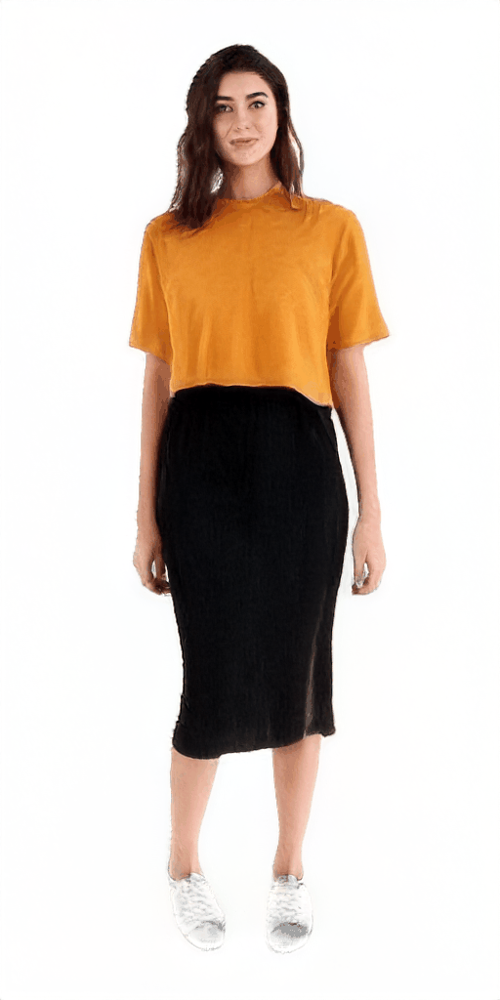

In [156]:
display_gif(rec_1_path)

In [168]:
with torch.no_grad():
    rec_1_path = f'{save_dir}/find_tuned_manipulalted.gif'
    src_feat = model.clip_encode_text("A photo of a woman wearing tshirt with short sleeves")  # - model.clip_encode_text([src_desc])
    tgt_feat = model.clip_encode_text("A photo of a woman wearing tshirt with long sleeves")  # - model.clip_encode_text([src_desc])
    
    W_c_ind = len(b1) // 2
    W_c = b1[W_c_ind:W_c_ind+1]
    ref_frame = model.stylegan_G(W_c)
    ref_frame_enc =  model.clip_loss.encode_images(ref_frame)
    rec_vid_1 = model(a1.unsqueeze(0), 
                                  c1,
                                  W_c,
                                  (tgt_feat - src_feat) * 3,
                                 ref_frame_enc)[0]
    save_gif(rec_vid_1, (-1, 1), rec_1_path)

torch.Size([1, 18, 512])
tensor([[ 2.6218e-01,  2.6181e-01,  1.3377e-02, -2.1919e-02,  3.9832e-01,
         -3.1861e-01, -8.7122e-01, -9.4622e-02, -6.5911e-02, -6.5568e-01,
          3.6940e-01,  2.7946e-01,  1.2196e-01, -8.2951e-02,  1.0100e-01,
         -2.6693e-02, -4.0118e-01, -1.0750e-01,  1.9004e-01,  6.6955e-02,
         -4.5757e-01,  7.0152e-01, -4.3712e-01, -5.4665e-01,  5.9757e-01,
          8.8904e-02,  2.6560e-01, -8.5702e-02, -1.2957e-01,  4.0997e-01,
          4.6700e-01, -1.3883e-01,  1.0417e-01, -6.2484e-01, -6.3691e-03,
         -4.6791e-01, -1.0265e-01, -9.0919e-01, -7.6124e-01, -9.6588e-02,
         -3.1455e-01,  1.0989e-01, -1.5994e-01,  3.8672e-01,  6.7538e-02,
          2.3500e-01, -4.7480e-01,  8.0832e-02,  1.4511e-01, -5.6765e-02,
         -2.1888e-01, -2.1185e-03, -1.7166e-01, -4.2798e-01, -8.3196e-01,
          1.8699e-01,  3.8975e-01,  3.3726e-01, -7.0708e-01, -2.6278e-01,
         -4.3287e-01, -3.5090e-01,  3.1067e-01,  4.3613e-01, -6.1569e-02,
          1.3

/kuacc/users/mali18/.conda/envs/styleode/lib/python3.8/site-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(


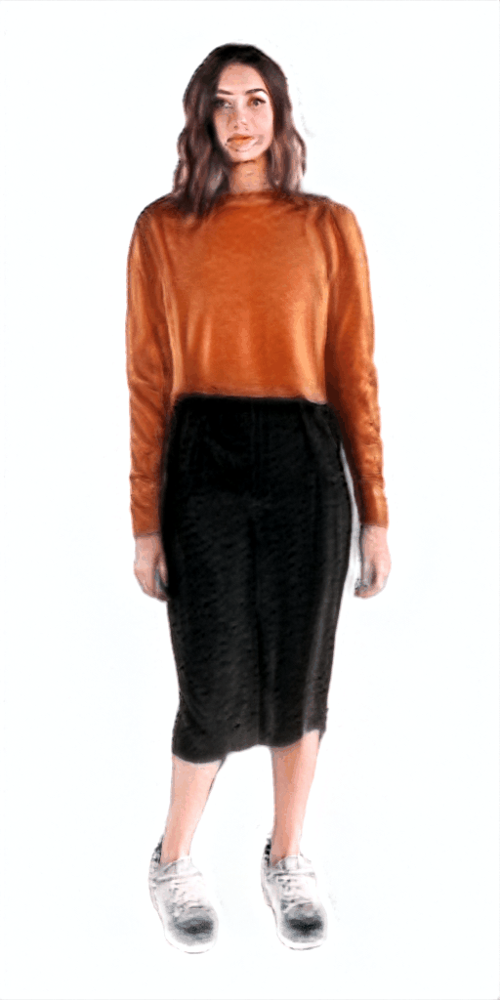

In [169]:
display_gif(rec_1_path)

In [ ]:
if save_ckpt: 
    